In [1]:
import os 
import numpy as np 
import cv2
import glob
import tensorflow as tf
from tqdm import tqdm
from tensorflow.keras.models import Model
import re
import pydicom
from PIL import Image
import numpy as np
import dicom2jpg
import shutil
from scipy.ndimage import label
from tensorflow.keras.preprocessing import image as imb


2024-07-08 11:04:53.231799: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-08 11:04:53.657375: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-08 11:04:54.563403: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/keanuf/anaconda3/envs/py310/lib/python3.10/site-packages/cv2/../../lib64::/home/keanuf/anaconda3/envs/py310/lib/
2024-07-08 11:04:54.563533: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] C

In [2]:
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)


def delete_all_files(folder_path):
    for root, dirs, files in os.walk(folder_path):
        for file_name in files:
            # Construct the full file path
            file_path = os.path.join(root, file_name)
            # Check if it's a file (not a directory)
            if os.path.isfile(file_path):
                # Delete the file
                os.remove(file_path)

    

    

In [3]:


inputdir = '/home/keanuf/.cache/Assignemt9/BRAIN SEGMENTATION/FULL_BRAIN/testDicom copy'
temp = 'temp'



#os.mkdir(outdir)
create_dir(temp)
delete_all_files(temp)

dicom2jpg.dicom2png(inputdir, temp) 

/home/keanuf/anaconda3/envs/py310/lib/python3.10/site-packages/dicom2jpg/utils.py:123: RuntimeWarning: invalid value encountered in divide
  pixel_array = ((pixel_array-pixel_array.min())/(pixel_array.max()-pixel_array.min())) * 255.0
/home/keanuf/anaconda3/envs/py310/lib/python3.10/site-packages/dicom2jpg/utils.py:130: RuntimeWarning: invalid value encountered in cast
  return pixel_array.astype('uint8')
/home/keanuf/anaconda3/envs/py310/lib/python3.10/site-packages/dicom2jpg/utils.py:123: RuntimeWarning: invalid value encountered in divide
  pixel_array = ((pixel_array-pixel_array.min())/(pixel_array.max()-pixel_array.min())) * 255.0
/home/keanuf/anaconda3/envs/py310/lib/python3.10/site-packages/dicom2jpg/utils.py:130: RuntimeWarning: invalid value encountered in cast
  return pixel_array.astype('uint8')
/home/keanuf/anaconda3/envs/py310/lib/python3.10/site-packages/dicom2jpg/utils.py:123: RuntimeWarning: invalid value encountered in divide
  pixel_array = ((pixel_array-pixel_array.m

True

In [4]:




def find_and_copy_png_files(source_dir, destination_dir):
    # Walk through all directories and subdirectories in the source directory
    for root, dirs, files in os.walk(source_dir):
        for file in files:
            # Check if the file is a PNG file
            if file.lower().endswith('.png'):
                # Copy the PNG file to the destination directory
                shutil.copy2(os.path.join(root, file), destination_dir)

# Specify the source directory containing the folders
source_directory = temp

# Specify the destination directory to save the PNG files
outdir = os.path.join("PNG_images")
create_dir(outdir)
delete_all_files(outdir)
# Call the function to find and copy PNG files
find_and_copy_png_files(source_directory, outdir)

print("PNG files copied successfully.")
delete_all_files(source_directory)

PNG files copied successfully.


In [5]:
items = os.listdir(inputdir)
first_item_path=""
if items:
    first_item = items[0]
    first_item_path = os.path.abspath(os.path.join(inputdir, first_item))
    first_item_path_raw = r"{}".format(first_item_path)
    print("Full path to the first item (raw string):", first_item_path_raw)
else:
    print("The folder is empty.")

Full path to the first item (raw string): /home/keanuf/.cache/Assignemt9/BRAIN SEGMENTATION/FULL_BRAIN/testDicom copy/ADNI_002_S_0295_PT_ADNI_Brain_PET__Raw_FDG_br_raw_20110609102538634_319_S111104_I239487.dcm


In [6]:
dicom_file_path = first_item_path

# Read the DICOM file
dicom_data = pydicom.dcmread(dicom_file_path)

# Extract patient information
patient_info = {
    "Patient Name": dicom_data.get("PatientName", "N/A"),
    "Patient ID": dicom_data.get("PatientID", "N/A"),
    "Patient Birth Date": dicom_data.get("PatientBirthDate", "N/A"),
    "Patient Sex": dicom_data.get("PatientSex", "N/A"),
    "Patient Age": dicom_data.get("PatientAge", "N/A"),
    "Patient Weight": dicom_data.get("PatientWeight", "N/A"),
    "Patient Address": dicom_data.get("PatientAddress", "N/A"),
}

# Print patient information
for key, value in patient_info.items():
    print(f"{key}: {value}")

Patient Name: 002_S_0295
Patient ID: 002_S_0295
Patient Birth Date: N/A
Patient Sex: M
Patient Age: 089Y
Patient Weight: 70.760000
Patient Address: N/A


In [7]:
test_path=outdir
directory = test_path
import os
import re
def natural_sort_key(s):
    """ Sort string in a human-readable way, handling numbers correctly. """
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

# Get a list of all the png files in the directory
files = [f for f in os.listdir(directory) if f.endswith('.png')]
files.sort(key=natural_sort_key)

# Rename each file
for i, filename in enumerate(files):
    new_name = f"{i}.png"
    os.rename(os.path.join(directory, filename), os.path.join(directory, new_name))



In [8]:
dataset_path = os.path.join("dataset", "aug")
files_dir= os.path.join("files", "aug")
model_file=os.path.join(files_dir, "unet_FULL_BRAIN20.h5")
prediction_file=os.path.join(files_dir, "brainmodel.h5")








create_dir(files_dir)

In [9]:
save_path=  os.path.join("prediction")
create_dir(save_path)
delete_all_files(save_path)
model2=tf.keras.models.load_model(model_file)
model2.summary()



2024-07-08 11:04:57.438804: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:09:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-08 11:04:57.479478: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:09:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-08 11:04:57.479550: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:09:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-08 11:04:57.480795: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate

Model: "UNET"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  1792        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                              

In [10]:

test_x=sorted(glob.glob(os.path.join(outdir,"*")))

print(len(test_x))
time_taken=[]
import time
for x in tqdm(test_x):
    name=x.split("/")[-1]
    print(name)
    x= cv2.imread(x ,cv2.IMREAD_COLOR)
    x=x / 255.0
    x=np.expand_dims(x,axis=0)
    start_time=time.time()
    p= model2.predict(x)[0]
    total_time=time.time()-start_time
    time_taken.append(total_time)
    p=p>0.5
    p=p*255
    cv2.imwrite(os.path.join(save_path, name),p)


540


  0%|          | 0/540 [00:00<?, ?it/s]

0.png


2024-07-08 11:05:02.520735: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2024-07-08 11:05:03.667281: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-07-08 11:05:03.694755: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-07-08 11:05:03.694810: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2024-07-08 11:05:03.721999: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-07-08 11:05:03.722137: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


1/1 [==============================] - 4s 4s/step


2024-07-08 11:05:05.687318: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
  0%|          | 1/540 [00:04<40:35,  4.52s/it]

1.png
1/1 [==============================] - 0s 19ms/step
10.png
1/1 [==============================] - 0s 21ms/step
100.png
1/1 [==============================] - 0s 21ms/step


  1%|          | 4/540 [00:04<07:59,  1.12it/s]

101.png
1/1 [==============================] - 0s 21ms/step
102.png
1/1 [==============================] - 0s 19ms/step


  1%|          | 6/540 [00:04<04:41,  1.90it/s]

103.png
1/1 [==============================] - 0s 20ms/step
104.png
1/1 [==============================] - 0s 21ms/step


  1%|▏         | 8/540 [00:04<03:03,  2.90it/s]

105.png
1/1 [==============================] - 0s 26ms/step
106.png
1/1 [==============================] - 0s 22ms/step


  2%|▏         | 10/540 [00:04<02:08,  4.13it/s]

107.png
1/1 [==============================] - 0s 21ms/step
108.png
1/1 [==============================] - 0s 21ms/step


  2%|▏         | 12/540 [00:05<01:34,  5.58it/s]

109.png
1/1 [==============================] - 0s 22ms/step
11.png
1/1 [==============================] - 0s 22ms/step


  3%|▎         | 14/540 [00:05<01:14,  7.10it/s]

110.png
1/1 [==============================] - 0s 23ms/step
111.png
1/1 [==============================] - 0s 26ms/step


  3%|▎         | 16/540 [00:05<00:59,  8.82it/s]

112.png
1/1 [==============================] - 0s 21ms/step
113.png
1/1 [==============================] - 0s 20ms/step


  3%|▎         | 18/540 [00:05<00:49, 10.55it/s]

114.png
1/1 [==============================] - 0s 22ms/step
115.png
1/1 [==============================] - 0s 19ms/step


  4%|▎         | 20/540 [00:05<00:42, 12.27it/s]

116.png
1/1 [==============================] - 0s 20ms/step
117.png
1/1 [==============================] - 0s 21ms/step
118.png
1/1 [==============================] - 0s 22ms/step


  4%|▍         | 23/540 [00:05<00:35, 14.43it/s]

119.png
1/1 [==============================] - 0s 21ms/step
12.png
1/1 [==============================] - 0s 26ms/step


  5%|▍         | 25/540 [00:05<00:33, 15.27it/s]

120.png
1/1 [==============================] - 0s 26ms/step
121.png
1/1 [==============================] - 0s 21ms/step


  5%|▌         | 27/540 [00:05<00:32, 15.78it/s]

122.png
1/1 [==============================] - 0s 28ms/step
123.png
1/1 [==============================] - 0s 21ms/step


  5%|▌         | 29/540 [00:06<00:31, 16.13it/s]

124.png
1/1 [==============================] - 0s 21ms/step
125.png
1/1 [==============================] - 0s 21ms/step


  6%|▌         | 31/540 [00:06<00:30, 16.60it/s]

126.png
1/1 [==============================] - 0s 22ms/step
127.png
1/1 [==============================] - 0s 25ms/step


  6%|▌         | 33/540 [00:06<00:30, 16.83it/s]

128.png
1/1 [==============================] - 0s 25ms/step
129.png
1/1 [==============================] - 0s 21ms/step


  6%|▋         | 35/540 [00:06<00:30, 16.72it/s]

13.png
1/1 [==============================] - 0s 22ms/step
130.png
1/1 [==============================] - 0s 19ms/step


  7%|▋         | 37/540 [00:06<00:29, 16.81it/s]

131.png
1/1 [==============================] - 0s 20ms/step
132.png
1/1 [==============================] - 0s 20ms/step


  7%|▋         | 39/540 [00:06<00:28, 17.35it/s]

133.png
1/1 [==============================] - 0s 19ms/step
134.png
1/1 [==============================] - 0s 19ms/step


  8%|▊         | 41/540 [00:06<00:27, 17.99it/s]

135.png
1/1 [==============================] - 0s 24ms/step
136.png
1/1 [==============================] - 0s 18ms/step


  8%|▊         | 43/540 [00:06<00:26, 18.47it/s]

137.png
1/1 [==============================] - 0s 25ms/step
138.png
1/1 [==============================] - 0s 19ms/step


  8%|▊         | 45/540 [00:06<00:27, 18.14it/s]

139.png
1/1 [==============================] - 0s 19ms/step
14.png
1/1 [==============================] - 0s 21ms/step


  9%|▊         | 47/540 [00:07<00:27, 18.14it/s]

140.png
1/1 [==============================] - 0s 21ms/step
141.png
1/1 [==============================] - 0s 21ms/step


  9%|▉         | 49/540 [00:07<00:27, 17.84it/s]

142.png
1/1 [==============================] - 0s 25ms/step
143.png
1/1 [==============================] - 0s 19ms/step


  9%|▉         | 51/540 [00:07<00:27, 17.89it/s]

144.png
1/1 [==============================] - 0s 19ms/step
145.png
1/1 [==============================] - 0s 19ms/step


 10%|▉         | 53/540 [00:07<00:26, 18.07it/s]

146.png
1/1 [==============================] - 0s 20ms/step
147.png
1/1 [==============================] - 0s 22ms/step


 10%|█         | 55/540 [00:07<00:27, 17.76it/s]

148.png
1/1 [==============================] - 0s 21ms/step
149.png
1/1 [==============================] - 0s 23ms/step


 11%|█         | 57/540 [00:07<00:27, 17.42it/s]

15.png
1/1 [==============================] - 0s 21ms/step
150.png
1/1 [==============================] - 0s 22ms/step


 11%|█         | 59/540 [00:07<00:27, 17.22it/s]

151.png
1/1 [==============================] - 0s 28ms/step
152.png
1/1 [==============================] - 0s 39ms/step


 11%|█▏        | 61/540 [00:07<00:30, 15.67it/s]

153.png
1/1 [==============================] - 0s 30ms/step
154.png
1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 63/540 [00:08<00:30, 15.62it/s]

155.png
1/1 [==============================] - 0s 23ms/step
156.png
1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 65/540 [00:08<00:30, 15.34it/s]

157.png
1/1 [==============================] - 0s 23ms/step
158.png
1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 67/540 [00:08<00:30, 15.43it/s]

159.png
1/1 [==============================] - 0s 18ms/step
16.png
1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 69/540 [00:08<00:29, 16.11it/s]

160.png
1/1 [==============================] - 0s 20ms/step
161.png
1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 71/540 [00:08<00:28, 16.63it/s]

162.png
1/1 [==============================] - 0s 19ms/step
163.png
1/1 [==============================] - 0s 19ms/step


 14%|█▎        | 73/540 [00:08<00:27, 17.09it/s]

164.png
1/1 [==============================] - 0s 21ms/step
165.png
1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 75/540 [00:08<00:28, 16.47it/s]

166.png
1/1 [==============================] - 0s 25ms/step
167.png
1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 77/540 [00:08<00:28, 16.41it/s]

168.png
1/1 [==============================] - 0s 20ms/step
169.png
1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 79/540 [00:08<00:27, 16.56it/s]

17.png
1/1 [==============================] - 0s 20ms/step
170.png
1/1 [==============================] - 0s 19ms/step


 15%|█▌        | 81/540 [00:09<00:27, 16.86it/s]

171.png
1/1 [==============================] - 0s 23ms/step
172.png
1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 83/540 [00:09<00:27, 16.72it/s]

173.png
1/1 [==============================] - 0s 21ms/step
174.png
1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 85/540 [00:09<00:27, 16.60it/s]

175.png
1/1 [==============================] - 0s 21ms/step
176.png
1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 87/540 [00:09<00:27, 16.40it/s]

177.png
1/1 [==============================] - 0s 21ms/step
178.png
1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 89/540 [00:09<00:27, 16.35it/s]

179.png
1/1 [==============================] - 0s 26ms/step
18.png
1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 91/540 [00:09<00:27, 16.20it/s]

180.png
1/1 [==============================] - 0s 22ms/step
181.png
1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 93/540 [00:09<00:28, 15.74it/s]

182.png
1/1 [==============================] - 0s 24ms/step
183.png
1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 95/540 [00:09<00:28, 15.47it/s]

184.png
1/1 [==============================] - 0s 27ms/step
185.png
1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 97/540 [00:10<00:28, 15.54it/s]

186.png
1/1 [==============================] - 0s 20ms/step
187.png
1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 99/540 [00:10<00:27, 15.78it/s]

188.png
1/1 [==============================] - 0s 25ms/step
189.png
1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 101/540 [00:10<00:27, 15.94it/s]

19.png
1/1 [==============================] - 0s 23ms/step
190.png
1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 103/540 [00:10<00:28, 15.44it/s]

191.png
1/1 [==============================] - 0s 30ms/step
192.png
1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 105/540 [00:10<00:29, 14.96it/s]

193.png
1/1 [==============================] - 0s 22ms/step
194.png
1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 107/540 [00:10<00:28, 15.11it/s]

195.png
1/1 [==============================] - 0s 29ms/step
196.png
1/1 [==============================] - 0s 25ms/step


 20%|██        | 109/540 [00:10<00:30, 14.15it/s]

197.png
1/1 [==============================] - 0s 27ms/step
198.png
1/1 [==============================] - 0s 26ms/step


 21%|██        | 111/540 [00:11<00:29, 14.44it/s]

199.png
1/1 [==============================] - 0s 20ms/step
2.png
1/1 [==============================] - 0s 21ms/step


 21%|██        | 113/540 [00:11<00:29, 14.67it/s]

20.png
1/1 [==============================] - 0s 24ms/step
200.png
1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 115/540 [00:11<00:30, 13.78it/s]

201.png
1/1 [==============================] - 0s 24ms/step
202.png
1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 117/540 [00:11<00:29, 14.32it/s]

203.png
1/1 [==============================] - 0s 21ms/step
204.png
1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 119/540 [00:11<00:29, 14.51it/s]

205.png
1/1 [==============================] - 0s 21ms/step
206.png
1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 121/540 [00:11<00:28, 14.53it/s]

207.png
1/1 [==============================] - 0s 29ms/step
208.png
1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 123/540 [00:11<00:28, 14.51it/s]

209.png
1/1 [==============================] - 0s 21ms/step
21.png
1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 125/540 [00:12<00:28, 14.73it/s]

210.png
1/1 [==============================] - 0s 28ms/step
211.png
1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 127/540 [00:12<00:28, 14.60it/s]

212.png
1/1 [==============================] - 0s 26ms/step
213.png
1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 129/540 [00:12<00:27, 14.89it/s]

214.png
1/1 [==============================] - 0s 21ms/step
215.png
1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 131/540 [00:12<00:28, 14.30it/s]

216.png
1/1 [==============================] - 0s 26ms/step
217.png
1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 133/540 [00:12<00:27, 14.63it/s]

218.png
1/1 [==============================] - 0s 36ms/step
219.png
1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 135/540 [00:12<00:28, 14.21it/s]

22.png
1/1 [==============================] - 0s 24ms/step
220.png
1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 137/540 [00:12<00:27, 14.56it/s]

221.png
1/1 [==============================] - 0s 31ms/step
222.png
1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 139/540 [00:12<00:27, 14.43it/s]

223.png
1/1 [==============================] - 0s 19ms/step
224.png
1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 141/540 [00:13<00:29, 13.61it/s]

225.png
1/1 [==============================] - 0s 24ms/step
226.png
1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 143/540 [00:13<00:29, 13.61it/s]

227.png
1/1 [==============================] - 0s 30ms/step
228.png
1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 145/540 [00:13<00:28, 13.72it/s]

229.png
1/1 [==============================] - 0s 29ms/step
23.png
1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 147/540 [00:13<00:28, 13.84it/s]

230.png
1/1 [==============================] - 0s 30ms/step
231.png
1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 149/540 [00:13<00:27, 14.13it/s]

232.png
1/1 [==============================] - 0s 27ms/step
233.png
1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 151/540 [00:13<00:27, 14.14it/s]

234.png
1/1 [==============================] - 0s 22ms/step
235.png
1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 153/540 [00:13<00:27, 14.25it/s]

236.png
1/1 [==============================] - 0s 23ms/step
237.png
1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 155/540 [00:14<00:26, 14.29it/s]

238.png
1/1 [==============================] - 0s 25ms/step
239.png
1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 157/540 [00:14<00:26, 14.29it/s]

24.png
1/1 [==============================] - 0s 23ms/step
240.png
1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 159/540 [00:14<00:26, 14.16it/s]

241.png
1/1 [==============================] - 0s 23ms/step
242.png
1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 161/540 [00:14<00:26, 14.17it/s]

243.png
1/1 [==============================] - 0s 24ms/step
244.png
1/1 [==============================] - 0s 21ms/step


 30%|███       | 163/540 [00:14<00:26, 14.30it/s]

245.png
1/1 [==============================] - 0s 24ms/step
246.png
1/1 [==============================] - 0s 23ms/step


 31%|███       | 165/540 [00:14<00:26, 14.41it/s]

247.png
1/1 [==============================] - 0s 23ms/step
248.png
1/1 [==============================] - 0s 23ms/step


 31%|███       | 167/540 [00:14<00:25, 14.40it/s]

249.png
1/1 [==============================] - 0s 22ms/step
25.png
1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 169/540 [00:15<00:25, 14.59it/s]

250.png
1/1 [==============================] - 0s 23ms/step
251.png
1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 171/540 [00:15<00:25, 14.37it/s]

252.png
1/1 [==============================] - 0s 24ms/step
253.png
1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 173/540 [00:15<00:25, 14.34it/s]

254.png
1/1 [==============================] - 0s 21ms/step
255.png
1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 175/540 [00:15<00:25, 14.38it/s]

256.png
1/1 [==============================] - 0s 30ms/step
257.png
1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 177/540 [00:15<00:25, 14.08it/s]

258.png
1/1 [==============================] - 0s 23ms/step
259.png
1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 179/540 [00:15<00:25, 14.10it/s]

26.png
1/1 [==============================] - 0s 22ms/step
260.png
1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 181/540 [00:15<00:25, 14.18it/s]

261.png
1/1 [==============================] - 0s 24ms/step
262.png
1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 183/540 [00:16<00:25, 14.00it/s]

263.png
1/1 [==============================] - 0s 25ms/step
264.png
1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 185/540 [00:16<00:25, 13.81it/s]

265.png
1/1 [==============================] - 0s 30ms/step
266.png
1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 187/540 [00:16<00:25, 13.88it/s]

267.png
1/1 [==============================] - 0s 29ms/step
268.png
1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 189/540 [00:16<00:25, 13.72it/s]

269.png
1/1 [==============================] - 0s 24ms/step
27.png
1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 191/540 [00:16<00:25, 13.89it/s]

270.png
1/1 [==============================] - 0s 27ms/step
271.png
1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 193/540 [00:16<00:24, 13.93it/s]

272.png
1/1 [==============================] - 0s 24ms/step
273.png
1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 195/540 [00:16<00:24, 13.83it/s]

274.png
1/1 [==============================] - 0s 45ms/step
275.png
1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 197/540 [00:17<00:26, 13.08it/s]

276.png
1/1 [==============================] - 0s 24ms/step
277.png
1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 199/540 [00:17<00:26, 13.07it/s]

278.png
1/1 [==============================] - 0s 25ms/step
279.png
1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 201/540 [00:17<00:25, 13.09it/s]

28.png
1/1 [==============================] - 0s 24ms/step
280.png
1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 203/540 [00:17<00:25, 13.41it/s]

281.png
1/1 [==============================] - 0s 26ms/step
282.png
1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 205/540 [00:17<00:24, 13.68it/s]

283.png
1/1 [==============================] - 0s 21ms/step
284.png
1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 207/540 [00:17<00:23, 14.13it/s]

285.png
1/1 [==============================] - 0s 23ms/step
286.png
1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 209/540 [00:18<00:23, 14.28it/s]

287.png
1/1 [==============================] - 0s 21ms/step
288.png
1/1 [==============================] - 0s 19ms/step


 39%|███▉      | 211/540 [00:18<00:22, 14.67it/s]

289.png
1/1 [==============================] - 0s 22ms/step
29.png
1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 213/540 [00:18<00:22, 14.78it/s]

290.png
1/1 [==============================] - 0s 23ms/step
291.png
1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 215/540 [00:18<00:21, 14.82it/s]

292.png
1/1 [==============================] - 0s 20ms/step
293.png
1/1 [==============================] - 0s 28ms/step


 40%|████      | 217/540 [00:18<00:22, 14.57it/s]

294.png
1/1 [==============================] - 0s 25ms/step
295.png
1/1 [==============================] - 0s 26ms/step


 41%|████      | 219/540 [00:18<00:22, 14.01it/s]

296.png
1/1 [==============================] - 0s 30ms/step
297.png
1/1 [==============================] - 0s 26ms/step


 41%|████      | 221/540 [00:18<00:22, 13.87it/s]

298.png
1/1 [==============================] - 0s 29ms/step
299.png
1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 223/540 [00:18<00:22, 14.02it/s]

3.png
1/1 [==============================] - 0s 22ms/step
30.png
1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 225/540 [00:19<00:22, 13.82it/s]

300.png
1/1 [==============================] - 0s 30ms/step
301.png
1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 227/540 [00:19<00:23, 13.59it/s]

302.png
1/1 [==============================] - 0s 26ms/step
303.png
1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 229/540 [00:19<00:23, 13.45it/s]

304.png
1/1 [==============================] - 0s 23ms/step
305.png
1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 231/540 [00:19<00:22, 13.80it/s]

306.png
1/1 [==============================] - 0s 30ms/step
307.png
1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 233/540 [00:19<00:22, 13.72it/s]

308.png
1/1 [==============================] - 0s 28ms/step
309.png
1/1 [==============================] - 0s 34ms/step


 44%|████▎     | 235/540 [00:19<00:23, 13.21it/s]

31.png
1/1 [==============================] - 0s 23ms/step
310.png
1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 237/540 [00:20<00:22, 13.21it/s]

311.png
1/1 [==============================] - 0s 30ms/step
312.png
1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 239/540 [00:20<00:22, 13.20it/s]

313.png
1/1 [==============================] - 0s 25ms/step
314.png
1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 241/540 [00:20<00:22, 13.58it/s]

315.png
1/1 [==============================] - 0s 24ms/step
316.png
1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 243/540 [00:20<00:21, 13.80it/s]

317.png
1/1 [==============================] - 0s 23ms/step
318.png
1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 245/540 [00:20<00:21, 13.98it/s]

319.png
1/1 [==============================] - 0s 24ms/step
32.png
1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 247/540 [00:20<00:21, 13.70it/s]

320.png
1/1 [==============================] - 0s 29ms/step
321.png
1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 249/540 [00:20<00:20, 13.88it/s]

322.png
1/1 [==============================] - 0s 26ms/step
323.png
1/1 [==============================] - 0s 19ms/step


 46%|████▋     | 251/540 [00:21<00:20, 14.08it/s]

324.png
1/1 [==============================] - 0s 23ms/step
325.png
1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 253/540 [00:21<00:20, 14.24it/s]

326.png
1/1 [==============================] - 0s 23ms/step
327.png
1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 255/540 [00:21<00:19, 14.37it/s]

328.png
1/1 [==============================] - 0s 22ms/step
329.png
1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 257/540 [00:21<00:19, 14.44it/s]

33.png
1/1 [==============================] - 0s 22ms/step
330.png
1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 259/540 [00:21<00:19, 14.63it/s]

331.png
1/1 [==============================] - 0s 22ms/step
332.png
1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 261/540 [00:21<00:19, 14.66it/s]

333.png
1/1 [==============================] - 0s 23ms/step
334.png
1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 263/540 [00:21<00:18, 14.71it/s]

335.png
1/1 [==============================] - 0s 22ms/step
336.png
1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 265/540 [00:21<00:18, 14.91it/s]

337.png
1/1 [==============================] - 0s 24ms/step
338.png
1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 267/540 [00:22<00:18, 14.54it/s]

339.png
1/1 [==============================] - 0s 22ms/step
34.png
1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 269/540 [00:22<00:18, 14.66it/s]

340.png
1/1 [==============================] - 0s 22ms/step
341.png
1/1 [==============================] - 0s 19ms/step


 50%|█████     | 271/540 [00:22<00:18, 14.72it/s]

342.png
1/1 [==============================] - 0s 26ms/step
343.png
1/1 [==============================] - 0s 18ms/step


 51%|█████     | 273/540 [00:22<00:17, 14.84it/s]

344.png
1/1 [==============================] - 0s 22ms/step
345.png
1/1 [==============================] - 0s 19ms/step


 51%|█████     | 275/540 [00:22<00:17, 14.80it/s]

346.png
1/1 [==============================] - 0s 30ms/step
347.png
1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 277/540 [00:22<00:18, 14.01it/s]

348.png
1/1 [==============================] - 0s 26ms/step
349.png
1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 279/540 [00:22<00:18, 13.85it/s]

35.png
1/1 [==============================] - 0s 26ms/step
350.png
1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 281/540 [00:23<00:18, 13.83it/s]

351.png
1/1 [==============================] - 0s 21ms/step
352.png
1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 283/540 [00:23<00:18, 14.04it/s]

353.png
1/1 [==============================] - 0s 24ms/step
354.png
1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 285/540 [00:23<00:18, 14.03it/s]

355.png
1/1 [==============================] - 0s 23ms/step
356.png
1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 287/540 [00:23<00:17, 14.19it/s]

357.png
1/1 [==============================] - 0s 21ms/step
358.png
1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 289/540 [00:23<00:17, 14.43it/s]

359.png
1/1 [==============================] - 0s 23ms/step
36.png
1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 291/540 [00:23<00:17, 14.43it/s]

360.png
1/1 [==============================] - 0s 23ms/step
361.png
1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 293/540 [00:23<00:17, 14.50it/s]

362.png
1/1 [==============================] - 0s 24ms/step
363.png
1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 295/540 [00:24<00:16, 14.44it/s]

364.png
1/1 [==============================] - 0s 22ms/step
365.png
1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 297/540 [00:24<00:16, 14.58it/s]

366.png
1/1 [==============================] - 0s 23ms/step
367.png
1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 299/540 [00:24<00:16, 14.66it/s]

368.png
1/1 [==============================] - 0s 24ms/step
369.png
1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 301/540 [00:24<00:16, 14.54it/s]

37.png
1/1 [==============================] - 0s 22ms/step
370.png
1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 303/540 [00:24<00:16, 14.62it/s]

371.png
1/1 [==============================] - 0s 22ms/step
372.png
1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 305/540 [00:24<00:16, 14.39it/s]

373.png
1/1 [==============================] - 0s 27ms/step
374.png
1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 307/540 [00:24<00:16, 14.33it/s]

375.png
1/1 [==============================] - 0s 22ms/step
376.png
1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 309/540 [00:25<00:16, 14.21it/s]

377.png
1/1 [==============================] - 0s 24ms/step
378.png
1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 311/540 [00:25<00:16, 14.22it/s]

379.png
1/1 [==============================] - 0s 22ms/step
38.png
1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 313/540 [00:25<00:15, 14.53it/s]

380.png
1/1 [==============================] - 0s 23ms/step
381.png
1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 315/540 [00:25<00:15, 14.54it/s]

382.png
1/1 [==============================] - 0s 23ms/step
383.png
1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 317/540 [00:25<00:15, 14.54it/s]

384.png
1/1 [==============================] - 0s 24ms/step
385.png
1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 319/540 [00:25<00:15, 14.48it/s]

386.png
1/1 [==============================] - 0s 33ms/step
387.png
1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 321/540 [00:25<00:15, 13.80it/s]

388.png
1/1 [==============================] - 0s 28ms/step
389.png
1/1 [==============================] - 0s 26ms/step


 60%|█████▉    | 323/540 [00:26<00:15, 13.60it/s]

39.png
1/1 [==============================] - 0s 33ms/step
390.png
1/1 [==============================] - 0s 26ms/step


 60%|██████    | 325/540 [00:26<00:15, 13.55it/s]

391.png
1/1 [==============================] - 0s 29ms/step
392.png
1/1 [==============================] - 0s 23ms/step


 61%|██████    | 327/540 [00:26<00:15, 13.59it/s]

393.png
1/1 [==============================] - 0s 23ms/step
394.png
1/1 [==============================] - 0s 22ms/step


 61%|██████    | 329/540 [00:26<00:15, 13.54it/s]

395.png
1/1 [==============================] - 0s 22ms/step
396.png
1/1 [==============================] - 0s 24ms/step


 61%|██████▏   | 331/540 [00:26<00:15, 13.82it/s]

397.png
1/1 [==============================] - 0s 24ms/step
398.png
1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 333/540 [00:26<00:15, 13.69it/s]

399.png
1/1 [==============================] - 0s 23ms/step
4.png
1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 335/540 [00:26<00:14, 13.71it/s]

40.png
1/1 [==============================] - 0s 24ms/step
400.png
1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 337/540 [00:27<00:14, 14.00it/s]

401.png
1/1 [==============================] - 0s 28ms/step
402.png
1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 339/540 [00:27<00:14, 14.00it/s]

403.png
1/1 [==============================] - 0s 29ms/step
404.png
1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 341/540 [00:27<00:14, 13.99it/s]

405.png
1/1 [==============================] - 0s 28ms/step
406.png
1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 343/540 [00:27<00:14, 14.01it/s]

407.png
1/1 [==============================] - 0s 26ms/step
408.png
1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 345/540 [00:27<00:13, 14.21it/s]

409.png
1/1 [==============================] - 0s 21ms/step
41.png
1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 347/540 [00:27<00:13, 14.36it/s]

410.png
1/1 [==============================] - 0s 23ms/step
411.png
1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 349/540 [00:27<00:13, 14.17it/s]

412.png
1/1 [==============================] - 0s 22ms/step
413.png
1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 351/540 [00:28<00:13, 14.28it/s]

414.png
1/1 [==============================] - 0s 37ms/step
415.png
1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 353/540 [00:28<00:14, 13.34it/s]

416.png
1/1 [==============================] - 0s 28ms/step
417.png
1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 355/540 [00:28<00:13, 13.49it/s]

418.png
1/1 [==============================] - 0s 23ms/step
419.png
1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 357/540 [00:28<00:13, 13.73it/s]

42.png
1/1 [==============================] - 0s 22ms/step
420.png
1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 359/540 [00:28<00:13, 13.75it/s]

421.png
1/1 [==============================] - 0s 30ms/step
422.png
1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 361/540 [00:28<00:12, 13.99it/s]

423.png
1/1 [==============================] - 0s 27ms/step
424.png
1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 363/540 [00:28<00:12, 13.93it/s]

425.png
1/1 [==============================] - 0s 23ms/step
426.png
1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 365/540 [00:29<00:12, 14.05it/s]

427.png
1/1 [==============================] - 0s 25ms/step
428.png
1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 367/540 [00:29<00:12, 14.24it/s]

429.png
1/1 [==============================] - 0s 25ms/step
43.png
1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 369/540 [00:29<00:12, 14.13it/s]

430.png
1/1 [==============================] - 0s 22ms/step
431.png
1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 371/540 [00:29<00:12, 14.06it/s]

432.png
1/1 [==============================] - 0s 25ms/step
433.png
1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 373/540 [00:29<00:11, 13.95it/s]

434.png
1/1 [==============================] - 0s 22ms/step
435.png
1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 375/540 [00:29<00:11, 14.10it/s]

436.png
1/1 [==============================] - 0s 21ms/step
437.png
1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 377/540 [00:29<00:11, 14.39it/s]

438.png
1/1 [==============================] - 0s 23ms/step
439.png
1/1 [==============================] - 0s 21ms/step


 70%|███████   | 379/540 [00:30<00:11, 14.20it/s]

44.png
1/1 [==============================] - 0s 22ms/step
440.png
1/1 [==============================] - 0s 24ms/step


 71%|███████   | 381/540 [00:30<00:11, 13.83it/s]

441.png
1/1 [==============================] - 0s 29ms/step
442.png
1/1 [==============================] - 0s 25ms/step


 71%|███████   | 383/540 [00:30<00:11, 13.87it/s]

443.png
1/1 [==============================] - 0s 25ms/step
444.png
1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 385/540 [00:30<00:10, 14.10it/s]

445.png
1/1 [==============================] - 0s 22ms/step
446.png
1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 387/540 [00:30<00:10, 14.16it/s]

447.png
1/1 [==============================] - 0s 26ms/step
448.png
1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 389/540 [00:30<00:10, 14.01it/s]

449.png
1/1 [==============================] - 0s 25ms/step
45.png
1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 391/540 [00:30<00:11, 13.12it/s]

450.png
1/1 [==============================] - 0s 24ms/step
451.png
1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 393/540 [00:31<00:11, 13.22it/s]

452.png
1/1 [==============================] - 0s 23ms/step
453.png
1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 395/540 [00:31<00:11, 12.73it/s]

454.png
1/1 [==============================] - 0s 28ms/step
455.png
1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 397/540 [00:31<00:10, 13.03it/s]

456.png
1/1 [==============================] - 0s 25ms/step
457.png
1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 399/540 [00:31<00:10, 13.37it/s]

458.png
1/1 [==============================] - 0s 23ms/step
459.png
1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 401/540 [00:31<00:10, 13.37it/s]

46.png
1/1 [==============================] - 0s 23ms/step
460.png
1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 403/540 [00:31<00:10, 13.56it/s]

461.png
1/1 [==============================] - 0s 25ms/step
462.png
1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 405/540 [00:31<00:09, 13.61it/s]

463.png
1/1 [==============================] - 0s 24ms/step
464.png
1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 407/540 [00:32<00:09, 13.78it/s]

465.png
1/1 [==============================] - 0s 24ms/step
466.png
1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 409/540 [00:32<00:09, 13.73it/s]

467.png
1/1 [==============================] - 0s 24ms/step
468.png
1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 411/540 [00:32<00:09, 13.80it/s]

469.png
1/1 [==============================] - 0s 29ms/step
47.png
1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 413/540 [00:32<00:09, 13.66it/s]

470.png
1/1 [==============================] - 0s 26ms/step
471.png
1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 415/540 [00:32<00:09, 13.87it/s]

472.png
1/1 [==============================] - 0s 22ms/step
473.png
1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 417/540 [00:32<00:08, 14.05it/s]

474.png
1/1 [==============================] - 0s 24ms/step
475.png
1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 419/540 [00:32<00:08, 13.95it/s]

476.png
1/1 [==============================] - 0s 28ms/step
477.png
1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 421/540 [00:33<00:08, 13.84it/s]

478.png
1/1 [==============================] - 0s 22ms/step
479.png
1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 423/540 [00:33<00:08, 14.01it/s]

48.png
1/1 [==============================] - 0s 25ms/step
480.png
1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 425/540 [00:33<00:08, 13.50it/s]

481.png
1/1 [==============================] - 0s 25ms/step
482.png
1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 427/540 [00:33<00:08, 13.60it/s]

483.png
1/1 [==============================] - 0s 29ms/step
484.png
1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 429/540 [00:33<00:08, 13.55it/s]

485.png
1/1 [==============================] - 0s 35ms/step
486.png
1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 431/540 [00:33<00:08, 13.54it/s]

487.png
1/1 [==============================] - 0s 28ms/step
488.png
1/1 [==============================] - 0s 30ms/step


 80%|████████  | 433/540 [00:34<00:07, 13.63it/s]

489.png
1/1 [==============================] - 0s 23ms/step
49.png
1/1 [==============================] - 0s 25ms/step


 81%|████████  | 435/540 [00:34<00:07, 13.80it/s]

490.png
1/1 [==============================] - 0s 27ms/step
491.png
1/1 [==============================] - 0s 25ms/step


 81%|████████  | 437/540 [00:34<00:07, 14.06it/s]

492.png
1/1 [==============================] - 0s 26ms/step
493.png
1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 439/540 [00:34<00:07, 13.84it/s]

494.png
1/1 [==============================] - 0s 23ms/step
495.png
1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 441/540 [00:34<00:07, 13.95it/s]

496.png
1/1 [==============================] - 0s 24ms/step
497.png
1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 443/540 [00:34<00:06, 14.06it/s]

498.png
1/1 [==============================] - 0s 22ms/step
499.png
1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 445/540 [00:34<00:06, 14.28it/s]

5.png
1/1 [==============================] - 0s 22ms/step
50.png
1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 447/540 [00:35<00:06, 14.32it/s]

500.png
1/1 [==============================] - 0s 27ms/step
501.png
1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 449/540 [00:35<00:06, 13.63it/s]

502.png
1/1 [==============================] - 0s 23ms/step
503.png
1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 451/540 [00:35<00:06, 13.84it/s]

504.png
1/1 [==============================] - 0s 41ms/step
505.png
1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 453/540 [00:35<00:06, 13.22it/s]

506.png
1/1 [==============================] - 0s 25ms/step
507.png
1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 455/540 [00:35<00:06, 13.45it/s]

508.png
1/1 [==============================] - 0s 22ms/step
509.png
1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 457/540 [00:35<00:06, 13.29it/s]

51.png
1/1 [==============================] - 0s 26ms/step
510.png
1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 459/540 [00:35<00:06, 13.41it/s]

511.png
1/1 [==============================] - 0s 24ms/step
512.png
1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 461/540 [00:36<00:05, 13.60it/s]

513.png
1/1 [==============================] - 0s 23ms/step
514.png
1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 463/540 [00:36<00:05, 13.42it/s]

515.png
1/1 [==============================] - 0s 26ms/step
516.png
1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 465/540 [00:36<00:05, 13.62it/s]

517.png
1/1 [==============================] - 0s 25ms/step
518.png
1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 467/540 [00:36<00:05, 13.52it/s]

519.png
1/1 [==============================] - 0s 24ms/step
52.png
1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 469/540 [00:36<00:05, 13.52it/s]

520.png
1/1 [==============================] - 0s 25ms/step
521.png
1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 471/540 [00:36<00:05, 13.77it/s]

522.png
1/1 [==============================] - 0s 23ms/step
523.png
1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 473/540 [00:36<00:04, 13.83it/s]

524.png
1/1 [==============================] - 0s 24ms/step
525.png
1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 475/540 [00:37<00:04, 13.99it/s]

526.png
1/1 [==============================] - 0s 27ms/step
527.png
1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 477/540 [00:37<00:04, 12.98it/s]

528.png
1/1 [==============================] - 0s 26ms/step
529.png
1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 479/540 [00:37<00:04, 13.12it/s]

53.png
1/1 [==============================] - 0s 23ms/step
530.png
1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 481/540 [00:37<00:04, 13.50it/s]

531.png
1/1 [==============================] - 0s 24ms/step
532.png
1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 483/540 [00:37<00:04, 13.77it/s]

533.png
1/1 [==============================] - 0s 24ms/step
534.png
1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 485/540 [00:37<00:04, 13.64it/s]

535.png
1/1 [==============================] - 0s 24ms/step
536.png
1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 487/540 [00:37<00:03, 13.36it/s]

537.png
1/1 [==============================] - 0s 27ms/step
538.png
1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 489/540 [00:38<00:03, 13.41it/s]

539.png
1/1 [==============================] - 0s 23ms/step
54.png
1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 491/540 [00:38<00:03, 13.71it/s]

55.png
1/1 [==============================] - 0s 27ms/step
56.png
1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 493/540 [00:38<00:03, 13.86it/s]

57.png
1/1 [==============================] - 0s 22ms/step
58.png
1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 495/540 [00:38<00:03, 14.08it/s]

59.png
1/1 [==============================] - 0s 40ms/step
6.png
1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 497/540 [00:38<00:04, 10.34it/s]

60.png
1/1 [==============================] - 0s 26ms/step
61.png
1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 499/540 [00:39<00:03, 11.16it/s]

62.png
1/1 [==============================] - 0s 25ms/step
63.png
1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 501/540 [00:39<00:03, 11.83it/s]

64.png
1/1 [==============================] - 0s 25ms/step
65.png
1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 503/540 [00:39<00:02, 12.36it/s]

66.png
1/1 [==============================] - 0s 25ms/step
67.png
1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 505/540 [00:39<00:02, 12.92it/s]

68.png
1/1 [==============================] - 0s 49ms/step
69.png
1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 507/540 [00:39<00:02, 12.23it/s]

7.png
1/1 [==============================] - 0s 29ms/step
70.png
1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 509/540 [00:39<00:02, 12.43it/s]

71.png
1/1 [==============================] - 0s 25ms/step
72.png
1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 511/540 [00:39<00:02, 12.08it/s]

73.png
1/1 [==============================] - 0s 25ms/step
74.png
1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 513/540 [00:40<00:02, 11.84it/s]

75.png
1/1 [==============================] - 0s 27ms/step
76.png
1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 515/540 [00:40<00:02, 11.29it/s]

77.png
1/1 [==============================] - 0s 24ms/step
78.png
1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 517/540 [00:40<00:02, 11.36it/s]

79.png
1/1 [==============================] - 0s 25ms/step
8.png
1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 519/540 [00:40<00:01, 12.11it/s]

80.png
1/1 [==============================] - 0s 24ms/step
81.png
1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 521/540 [00:40<00:01, 13.24it/s]

82.png
1/1 [==============================] - 0s 25ms/step
83.png
1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 523/540 [00:40<00:01, 14.07it/s]

84.png
1/1 [==============================] - 0s 28ms/step
85.png
1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 525/540 [00:41<00:01, 14.46it/s]

86.png
1/1 [==============================] - 0s 23ms/step
87.png
1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 527/540 [00:41<00:00, 15.22it/s]

88.png
1/1 [==============================] - 0s 22ms/step
89.png
1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 529/540 [00:41<00:00, 15.84it/s]

9.png
1/1 [==============================] - 0s 35ms/step
90.png
1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 531/540 [00:41<00:00, 15.29it/s]

91.png
1/1 [==============================] - 0s 25ms/step
92.png
1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 533/540 [00:41<00:00, 15.52it/s]

93.png
1/1 [==============================] - 0s 25ms/step
94.png
1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 535/540 [00:41<00:00, 15.82it/s]

95.png
1/1 [==============================] - 0s 22ms/step
96.png
1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 537/540 [00:41<00:00, 16.43it/s]

97.png
1/1 [==============================] - 0s 23ms/step
98.png
1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 539/540 [00:41<00:00, 17.05it/s]

99.png
1/1 [==============================] - 0s 21ms/step


100%|██████████| 540/540 [00:41<00:00, 12.89it/s]


In [11]:
import os
import numpy as np
from scipy.ndimage import binary_fill_holes
from PIL import Image

# Function to process and save an image
def process_image(image_path, output_path, threshold_value=128):
    # Load the grayscale image
    grayscale_image = Image.open(image_path).convert('L')
    grayscale_array = np.array(grayscale_image)

    # Threshold the grayscale image to get a binary image
    binary_image = grayscale_array > threshold_value

    # Fill holes in the binary image
    filled_binary_image = binary_fill_holes(binary_image)

    # Convert the filled binary image back to grayscale
    filled_grayscale_array = (filled_binary_image * 255).astype(np.uint8)

    # Convert the numpy array back to a PIL image
    filled_grayscale_image = Image.fromarray(filled_grayscale_array)

    # Save the resulting image
    filled_grayscale_image.save(output_path)

# Function to process all images in a folder
def process_folder(input_folder, output_folder, threshold_value=128):
    # Create the output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    # Loop through all files in the input folder
    for filename in os.listdir(input_folder):
        if filename.lower().endswith('.png'):
            input_path = os.path.join(input_folder, filename)
            output_path = os.path.join(output_folder, filename)
            process_image(input_path, output_path, threshold_value)
            print(f"Processed and saved: {output_path}")

# Define input and output folders
input_folder_fill = save_path
output_folder_fill = os.path.join('temp_bin_images')

delete_all_files(output_folder_fill)
# Process all images in the input folder
process_folder(input_folder_fill, output_folder_fill)
save_path=output_folder_fill

Processed and saved: temp_bin_images/533.png
Processed and saved: temp_bin_images/423.png
Processed and saved: temp_bin_images/427.png
Processed and saved: temp_bin_images/122.png
Processed and saved: temp_bin_images/184.png
Processed and saved: temp_bin_images/337.png
Processed and saved: temp_bin_images/366.png
Processed and saved: temp_bin_images/476.png
Processed and saved: temp_bin_images/237.png
Processed and saved: temp_bin_images/229.png
Processed and saved: temp_bin_images/121.png
Processed and saved: temp_bin_images/293.png
Processed and saved: temp_bin_images/23.png
Processed and saved: temp_bin_images/538.png
Processed and saved: temp_bin_images/163.png
Processed and saved: temp_bin_images/78.png
Processed and saved: temp_bin_images/63.png
Processed and saved: temp_bin_images/106.png
Processed and saved: temp_bin_images/474.png
Processed and saved: temp_bin_images/464.png
Processed and saved: temp_bin_images/79.png
Processed and saved: temp_bin_images/92.png
Processed and s

In [12]:
import os
from PIL import Image
def composite_images(image_folder, mask_folder, output_folder):
    # Get the list of image files in the input folder
    image_files = os.listdir(image_folder)
    
    # Iterate through each image file
    for image_file in image_files:
        # Construct the file paths for the current image and its corresponding mask
        image_path = os.path.join(image_folder, image_file)
        mask_file = image_file.split('.')[0] + '.png'  # Assuming masks have the same filename format as images
        mask_path = os.path.join(mask_folder, mask_file)
        
        # Open the image and mask
        image = Image.open(image_path)
        mask = Image.open(mask_path)
        
        # Perform composite operation
        result = Image.composite(image, Image.new('RGB', image.size, (0, 0, 0)), mask)
        
        # Construct the output file path
        output_file = os.path.join(output_folder, image_file)
        
        # Save the resulting composite image
        result.save(output_file) 

# Paths to input image and mask folders, and output folder
image_folder = test_path


mask_folder  = save_path
output_folder= os.path.join("segmentation")
create_dir(output_folder)
delete_all_files(output_folder)

# Call the function to composite images and masks and save the results
composite_images(image_folder, mask_folder, output_folder)

In [13]:
image_folder = output_folder # Change this to your folder path

# Get a list of all image files in the folder
image_files = glob.glob(os.path.join(image_folder, '*.*g'))  # This will include jpg, png, etc.

# Loop through each image file in the folder
image_files = glob.glob(os.path.join(image_folder, '*.*g'))  # This will include jpg, png, etc.

# Loop through each image file in the folder
for image_path in image_files:
    # Read the image
    img = cv2.imread(image_path)
    
    # Convert the image to grayscale if it is not already
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Convert the image to a binary image
    _, bw = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Identify the connected components in the binary image
    labeled_array, num_features = label(bw)
    
    # Check if the number of islands is greater than 5
    if num_features >20:
        # Delete the image if it has more than 5 islands
        os.remove(image_path)
        print(f'Deleted {os.path.basename(image_path)}')
        mask_image_path = os.path.join(mask_folder, os.path.basename(image_path))
        
        # Check if the mask image exists and delete it
        if os.path.exists(mask_image_path):
            os.remove(mask_image_path)
            print(f'Deleted mask {os.path.basename(mask_image_path)}')

print('Processing complete.')


Processing complete.


In [14]:
def rename(directory):
    files = [f for f in os.listdir(directory) if f.endswith('.png')]
    files.sort(key=natural_sort_key)

    # Rename each file
    for i, filename in enumerate(files):
        new_name = f"{i}.png"
        os.rename(os.path.join(directory, filename), os.path.join(directory, new_name))

In [15]:
# Threshold for considering a pixel as black (0-255 scale)
black_threshold = 100  # Adjust this value as needed

# Percentage threshold for considering an image mostly black
percentage_threshold = 98  # Adjust this value as needed

# Get a list of all image files in the folder
image_files = [f for f in os.listdir(image_folder) if f.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff'))]

# Loop through each image file in the folder
for image_file in image_files:
    # Get the full path of the image
    image_path = os.path.join(image_folder, image_file)
    
    # Read the image
    img = cv2.imread(image_path)
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    total_pixels = img.size
    num_black_pixels = np.sum(img < black_threshold)
    black_percentage = (num_black_pixels / total_pixels) * 100
    if black_percentage > percentage_threshold:

        os.remove(image_path)
        print(f'Deleted {image_file}')

        mask_image_path = os.path.join(save_path, image_file)
        source_image_path = os.path.join(outdir, image_file)

        if os.path.exists(mask_image_path):
            os.remove(mask_image_path)
            print(f'Deleted mask {image_file}')
            
        if os.path.exists(source_image_path):
            os.remove(source_image_path)
            print(f'Deleted source {image_file}')

print('Processing complete.')



Deleted 533.png
Deleted mask 533.png
Deleted source 533.png
Deleted 184.png
Deleted mask 184.png
Deleted source 184.png
Deleted 538.png
Deleted mask 538.png
Deleted source 538.png
Deleted 163.png
Deleted mask 163.png
Deleted source 163.png
Deleted 78.png
Deleted mask 78.png
Deleted source 78.png
Deleted 79.png
Deleted mask 79.png
Deleted source 79.png
Deleted 92.png
Deleted mask 92.png
Deleted source 92.png
Deleted 259.png
Deleted mask 259.png
Deleted source 259.png
Deleted 446.png
Deleted mask 446.png
Deleted source 446.png
Deleted 265.png
Deleted mask 265.png
Deleted source 265.png
Deleted 524.png
Deleted mask 524.png
Deleted source 524.png
Deleted 454.png
Deleted mask 454.png
Deleted source 454.png
Deleted 451.png
Deleted mask 451.png
Deleted source 451.png
Deleted 442.png
Deleted mask 442.png
Deleted source 442.png
Deleted 169.png
Deleted mask 169.png
Deleted source 169.png
Deleted 344.png
Deleted mask 344.png
Deleted source 344.png
Deleted 360.png
Deleted mask 360.png
Deleted sour

In [16]:
rename(outdir)

In [17]:


model_pred=tf.keras.models.load_model(prediction_file)
model_pred.summary()

results = []
folder_path=output_folder
# Iterate over each image in the folder
for filename in os.listdir(folder_path):
    if filename.endswith('.jpg') or filename.endswith('.png'):  # Check for image file types
        # Load and preprocess the image
        img_path = os.path.join(folder_path, filename)
        img = imb.load_img(img_path, target_size=(128, 128))
        img_array = imb.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = img_array / 255.0

        # Make a prediction
        predictions = model_pred.predict(img_array)

        # Save the filename and prediction to the results list
        if predictions[0][0] > 0.5:
            results.append(('CN', str(round(((predictions[0][0]-0.5)/0.5)*100, 2))+"%"))
        else:
            results.append(('AD', str(round(((0.5-predictions[0][0])/0.5)*100, 2))+"%"))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 128, 128, 32)      864       
                                                                 
 activation_7 (Activation)   (None, 128, 128, 32)      0         
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 32)      9216      
                                                                 
 batch_normalization_1 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 activation_8 (Activation)   (None, 128, 128, 32)      0         
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                  

In [18]:
import os
import re
import cv2

area_array = []
png_arra = []
total_value= []
image_directory = mask_folder
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

for filename in sorted_filenames:
    file_path = os.path.join(image_directory, filename)
    png_arra.append(file_path)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    white_pixel_count = cv2.countNonZero(image)
    area_array.append(white_pixel_count)

print(area_array)

image_directory = output_folder
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

for filename in sorted_filenames:
    file_path = os.path.join(image_directory, filename)
    png_arra.append(file_path)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    total = np.sum(image)
    total_value.append(total)

#print(area_array, len(area_array))
#print(total_value, len(total_value))
#print(png_arra, len(png_arra))

array1= np.array(area_array)
array2=np.array(total_value)

print("Shape of array1:", array1.shape)
print("Shape of array2:", array2.shape)
result = np.where(array2 != 0,  array2/array1 , 0)

areas=array1

[489, 679, 812, 896, 1008, 1083, 1134, 1189, 1228, 1254, 1288, 1344, 1380, 1429, 1517, 2003, 2703, 2839, 2956, 3073, 3197, 3347, 3393, 3224, 3212, 3666, 3806, 3864, 3958, 4039, 4066, 4089, 4060, 4096, 4109, 4142, 4203, 4238, 4244, 4233, 4189, 4154, 4101, 4034, 3961, 3928, 3855, 3793, 3698, 3591, 3447, 3307, 3149, 3019, 2898, 2751, 2610, 2382, 2160, 2001, 1728, 1515, 1342, 1088, 794, 498, 469, 635, 797, 948, 1027, 1084, 1136, 1205, 1234, 1253, 1277, 1322, 1364, 1340, 1443, 2070, 2594, 2808, 2969, 3087, 3199, 3298, 3398, 3388, 3455, 3701, 3802, 3835, 3917, 4016, 4070, 4126, 4171, 4106, 4117, 4188, 4223, 4246, 4260, 4225, 4192, 4166, 4136, 4072, 3983, 3919, 3808, 3755, 3678, 3577, 3432, 3285, 3140, 3004, 2888, 2740, 2595, 2395, 2179, 2033, 1753, 1533, 1280, 1027, 708, 497, 766, 354, 590, 723, 856, 960, 1019, 1076, 1147, 1194, 1230, 1268, 1313, 1355, 1419, 1454, 1413, 1853, 2397, 2747, 2907, 2987, 3125, 3277, 3326, 3123, 2894, 3391, 3772, 3862, 3915, 4011, 4080, 4073, 4071, 4090, 4124, 418

In [19]:
print(result)

[149.8609407  161.10603829 161.35098522 152.09263393 157.07837302
 168.28254848 163.08465608 165.33809924 161.02931596 155.16905901
 157.60947205 155.19270833 149.82318841 137.65430371 139.22346737
 131.56864703 140.57898631 139.71222261 141.97834912 149.04328018
 134.77885518 134.87152674 135.97435897 128.12127792 118.34090909
 123.27032188 133.05307409 139.03519669 140.11571501 145.87546422
 145.52680767 138.46172658 126.31305419 131.46166992 129.47018739
 117.49082569 120.72662384 128.51156206 125.26696513 120.82352941
 114.01599427 109.64973519 105.3552792   97.40431334  99.96415047
 116.2746945  121.19662776 132.51489586 142.04137372 144.78557505
 145.11546272 141.65557907 145.22610352 143.86121232 139.00552105
 141.52562704 148.74636015 142.64525609 134.99027778 134.89755122
 145.70081019 143.21716172 146.68181818 143.41819853 142.14735516
 147.74899598 144.54371002 146.61889764 152.81932246 165.36814346
 175.57156767 173.64483395 163.3318662  159.77427386 152.96272285
 152.08619

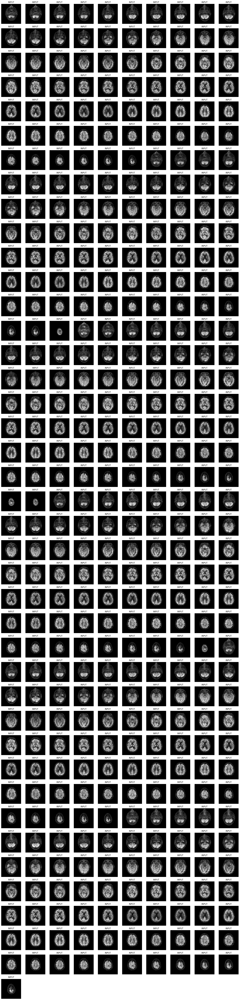

In [20]:
import matplotlib.pyplot as plt
import math
image_directory = test_path
 # Array containing titles corresponding to each image
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

num_images = len(sorted_filenames)
num_cols = 10  # Number of columns
num_rows = math.ceil(num_images / num_cols)  # Calculate the number of rows needed

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, num_rows * 2))  # Dynamic figsize based on num_rows

for ax_row, row_index in zip(axes, range(num_rows)):
    for ax, filename in zip(ax_row, sorted_filenames[row_index * num_cols:]):
        file_path = os.path.join(image_directory, filename)
        image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
        ax.imshow(image, cmap='gray')
        ax.set_title("INPUT")  # Set title from the results array
        ax.axis('off')  # Turn off axis

# Hide empty subplots if any
for i in range(num_images, num_rows * num_cols):
    axes.flatten()[i].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

Patient Name: 002_S_0295
Patient ID: 002_S_0295
Patient Birth Date: N/A
Patient Sex: M
Patient Age: 089Y
Patient Weight: 70.760000
Patient Address: N/A


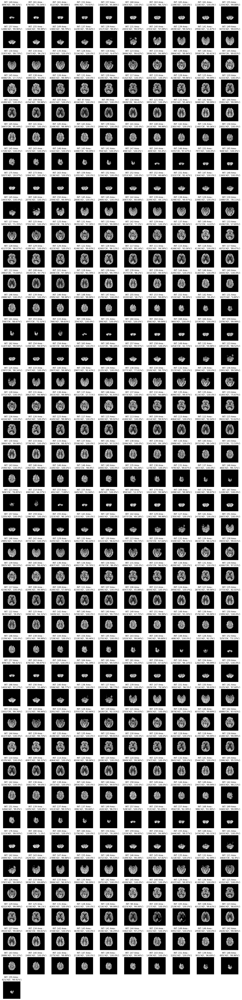

('AD', '99.31%')


In [21]:
import matplotlib.pyplot as plt
import math
from textwrap import wrap
for key, value in patient_info.items():
    print(f"{key}: {value}")

image_directory = output_folder
 # Array containing titles corresponding to each image
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

num_images = len(sorted_filenames)
num_cols = 10  # Number of columns
num_rows = math.ceil(num_images / num_cols)  # Calculate the number of rows needed

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, num_rows * 2))  # Dynamic figsize based on num_rows

for ax_row, row_index in zip(axes, range(num_rows)):
    for ax, filename, intentsity, area, pred in zip(ax_row, sorted_filenames[row_index * num_cols:], result[row_index * num_cols:], areas[row_index * num_cols:], results[row_index * num_cols:]):
        file_path = os.path.join(image_directory, filename)
        image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
        ax.imshow(image, cmap='gray')
        title_l="INT: "+str(int(intentsity))+ " Area : " +str(int(area))+str(pred)
        wrapped_title = "\n".join(wrap(title_l, width=20))
        ax.set_title(wrapped_title)  # Set title from the results array
        ax.axis('off')  # Turn off axis

# Hide empty subplots if any
for i in range(num_images, num_rows * num_cols):
    axes.flatten()[i].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()
print(results[0])

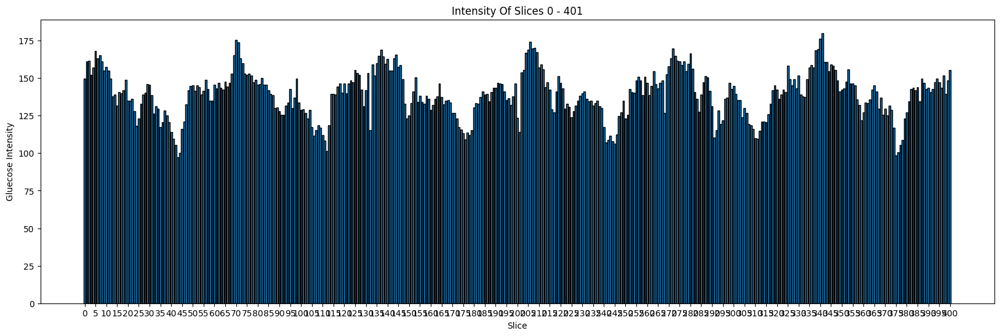

In [22]:

import matplotlib.pyplot as plt

def plot_histogram(data):
    plt.figure(figsize=(20, 6))  # Adjust the width and height of the figure as needed
    plt.bar(range(len(data)), data, align='center', edgecolor='black')
    plt.xlabel('Slice')
    plt.ylabel('Gluecose Intensity')
    plt.title('Intensity Of Slices 0 - '+str(len(data)))
    plt.xticks(range(0, len(data), 5))  # Set ticks at increments of 10
    plt.grid(False)
    plt.show()



plot_histogram(result)




In [23]:
import numpy as np
import os
import re
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import load_model

def natural_sort_key(s):
    """Sort string in a human-readable way, handling numbers correctly."""
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

# Load test images
def load_test_images(image_dir, image_size):
    images = []
    image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.png')], key=natural_sort_key)  # Use natural_sort_key for sorting
    
    for img_file in image_files:
        # Load image
        img_path = os.path.join(image_dir, img_file)
        img = load_img(img_path, color_mode="grayscale", target_size=image_size)
        img = img_to_array(img) / 255.0  # Normalize to [0, 1]
        images.append(img)
    
    images = np.array(images)
    return images, image_files

# Post-process the predictions to convert them to class labels
def decode_predictions(preds):
    return np.argmax(preds, axis=-1)

# Define custom color map for visualization
def apply_custom_color_map(prediction, mask_classes):
    colored_mask = np.zeros((*prediction.shape, 3))
    for class_idx, color in mask_classes.items():
        colored_mask[prediction == class_idx] = color
    return colored_mask

# Define mask classes with their corresponding colors
mask_classes = {
    0: (0, 0, 0),    # Class 0 color
    1: (255, 0, 0),  # Class 1 color
    2: (0, 255, 0),  # Class 2 color
    3: (0, 0, 255),  # Class 3 color
    4: (255, 255, 0),# Class 4 color
    5: (255, 0, 255) # Class 5 color
    # Add more colors for additional classes as needed
}

# Load test images
test_image_dir = output_folder
image_size = (128, 128)
test_images, test_image_files = load_test_images(test_image_dir, image_size)

# Load the trained model
model = load_model('unet_model.h5')

# Predict the segmentation masks
predictions = model.predict(test_images)

# Decode predictions
decoded_predictions = decode_predictions(predictions)

# Plot and save the results with custom colored masks
output_dir = os.path.join('multiclass_images_images')

create_dir(output_dir)
delete_all_files(output_dir)
for i, pred in enumerate(decoded_predictions):
    colored_mask = apply_custom_color_map(pred, mask_classes)
    plt.imshow(test_images[i], cmap='gray')
    plt.imshow(colored_mask, alpha=0.5)  # Overlay the colored mask on the original image
    plt.axis('off')
    output_path = os.path.join(output_dir, f'prediction_{i}.png')
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

print("Segmentation results saved successfully.")


13/13 [==============================] - 8s 309ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Segmentation results saved successfully.


In [24]:
import cv2
import numpy as np
import os
from pathlib import Path

# Directory containing the grayscale images
input_dir = output_folder

threashold_folder = os.path.join("threashold")
create_dir(threashold_folder)
delete_all_files(threashold_folder)
# Create the output directory if it does not exist
Path(threashold_folder).mkdir(parents=True, exist_ok=True)

# Threshold value
threshold_value =100# You can adjust this value

# Iterate through all the images in the input directory
for filename in os.listdir(input_dir):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        # Read the grayscale image
        img = cv2.imread(os.path.join(input_dir, filename), cv2.IMREAD_GRAYSCALE)
        
        # Apply thresholding to create a binary mask
        _, mask = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)
        
        # Save the mask
        mask_filename = os.path.join(threashold_folder, filename)
        cv2.imwrite(mask_filename, mask)

print("Segmentation masks created and saved successfully.")

Segmentation masks created and saved successfully.


In [25]:
import cv2
import numpy as np
import os
def resize_image(image, size=(128, 128)):
    return cv2.resize(image, size, interpolation=cv2.INTER_AREA)

def combine_images(color_img, grayscale_img, mask_img):
    # Resize images to 128x128
    color_img = resize_image(color_img)
    grayscale_img = resize_image(grayscale_img)
    mask_img = resize_image(mask_img)
    
    # Ensure the mask is binary
    _, mask = cv2.threshold(mask_img, 127, 255, cv2.THRESH_BINARY)
    
    # Convert the grayscale image to a 3-channel image
    grayscale_img_colored = cv2.cvtColor(grayscale_img, cv2.COLOR_GRAY2BGR)
    
    # Apply the mask to combine the images
    combined_img = np.where(mask[..., None] == 255, color_img, grayscale_img_colored)
    
    return combined_img

# Define your file paths
color_img_dir = output_dir
grayscale_img_dir = outdir
mask_img_dir = threashold_folder
output_img_dir = os.path.join("refiend reigion mask")
create_dir(output_img_dir)
delete_all_files(output_img_dir)

# Get lists of image file paths
color_img_paths = sorted(glob.glob(os.path.join(color_img_dir, '*.png')),key=lambda x: int(re.findall(r'\d+', x)[0]))
grayscale_img_paths = sorted(glob.glob(os.path.join(grayscale_img_dir, '*.png')),key=lambda x: int(re.findall(r'\d+', x)[0]))
mask_img_paths = sorted(glob.glob(os.path.join(mask_img_dir, '*.png')),key=lambda x: int(re.findall(r'\d+', x)[0]))

# Ensure all directories have the same number of images
assert len(color_img_paths) == len(grayscale_img_paths) == len(mask_img_paths)

for i in range(len(color_img_paths)):
    # Load the images
    color_img = cv2.imread(color_img_paths[i])
    grayscale_img = cv2.imread(grayscale_img_paths[i], cv2.IMREAD_GRAYSCALE)
    mask_img = cv2.imread(mask_img_paths[i], cv2.IMREAD_GRAYSCALE)
    
    # Combine the images
    combined_img = combine_images(color_img, grayscale_img, mask_img)
    
    # Save the result
    output_img_name = f'combined_{i}.png'
    output_img_path = os.path.join(output_img_dir, output_img_name)
    cv2.imwrite(output_img_path, combined_img)
    
    print(f'Saved combined image: {output_img_path}')

Saved combined image: refiend reigion mask/combined_0.png
Saved combined image: refiend reigion mask/combined_1.png
Saved combined image: refiend reigion mask/combined_2.png
Saved combined image: refiend reigion mask/combined_3.png
Saved combined image: refiend reigion mask/combined_4.png
Saved combined image: refiend reigion mask/combined_5.png
Saved combined image: refiend reigion mask/combined_6.png
Saved combined image: refiend reigion mask/combined_7.png
Saved combined image: refiend reigion mask/combined_8.png
Saved combined image: refiend reigion mask/combined_9.png
Saved combined image: refiend reigion mask/combined_10.png
Saved combined image: refiend reigion mask/combined_11.png
Saved combined image: refiend reigion mask/combined_12.png
Saved combined image: refiend reigion mask/combined_13.png
Saved combined image: refiend reigion mask/combined_14.png
Saved combined image: refiend reigion mask/combined_15.png
Saved combined image: refiend reigion mask/combined_16.png
Saved c

Patient Name: 002_S_0295
Patient ID: 002_S_0295
Patient Birth Date: N/A
Patient Sex: M
Patient Age: 089Y
Patient Weight: 70.760000
Patient Address: N/A


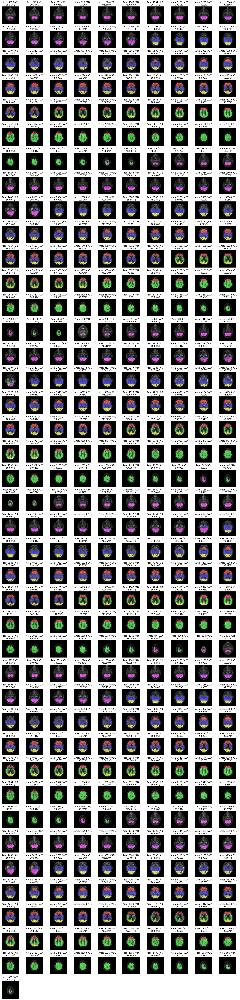

In [26]:
import matplotlib.pyplot as plt
import os
import math
import re
import cv2
from textwrap import wrap

# Assuming patient_info, output_dir, result, areas, and results are defined elsewhere in the code

for key, value in patient_info.items():
    print(f"{key}: {value}")

image_directory = output_img_dir
# Array containing titles corresponding to each image
# Get all filenames in the directory
filenames = os.listdir(image_directory)
# Sort filenames using regular expressions to sort numerically
sorted_filenames = sorted(filenames, key=lambda x: int(re.findall(r'\d+', x)[0]))

num_images = len(sorted_filenames)
num_cols = 10  # Number of columns
num_rows = math.ceil(num_images / num_cols)  # Calculate the number of rows needed

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, num_rows * 2))  # Dynamic figsize based on num_rows

for ax_row, row_index in zip(axes, range(num_rows)):
    for ax, filename, intensity, area, pred in zip(ax_row, sorted_filenames[row_index * num_cols:], result[row_index * num_cols:], areas[row_index * num_cols:], results[row_index * num_cols:]):
        file_path = os.path.join(image_directory, filename)
        image = cv2.imread(file_path, cv2.IMREAD_COLOR)  # Read image in color (RGB)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB format
        ax.imshow(image)
        title_l = f" Area: {int(area)} {pred}"
        wrapped_title = "\n".join(wrap(title_l, width=20))
        ax.set_title(wrapped_title)  # Set title from the results array
        ax.axis('off')  # Turn off axis

# Hide empty subplots if any
for i in range(num_images, num_rows * num_cols):
    axes.flatten()[i].axis('off')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


import skimage.io as io
import skimage.measure as measure
import os
import re
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
def load_images(directory):
    # Function to extract numerical index from the filename
    def extract_index(filename):
        match = re.search(r'(\d+)', filename)
        return int(match.group(1)) if match else -1

    # Sort files based on the extracted numerical index
    files = sorted(
        [os.path.join(directory, file) for file in os.listdir(directory) if file.endswith('.png')],
        key=lambda x: extract_index(os.path.basename(x))
    )
    
    images = [io.imread(file, as_gray=True) for file in files]
    volume = np.stack(images, axis=-1)
    return volume

def segment_brain(volume, percentile=90):
    threshold = np.percentile(volume, percentile)
    segmented = volume > threshold
    return segmented.astype(np.float32)
def natural_sort_key(s):
    """ Sort string in a human-readable way, handling numbers correctly. """
    return [int(text) if text.isdigit() else text.lower() for text in re.split('([0-9]+)', s)]

def rename_directory(directory_path):


    # Define the directory where your images are located
    directory = directory_path



    # Get a list of all the png files in the directory
    files = [f for f in os.listdir(directory) if f.endswith('.png')]

    # Sort the files by name, using natural sort
    files.sort(key=natural_sort_key)

    # Rename each file
    for i, filename in enumerate(files):
        new_name = f"{i}.png"
        os.rename(os.path.join(directory, filename), os.path.join(directory, new_name))

    return directory_path
    

def plot_3d(verts, faces):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2], cmap='bone', lw=1)
    plt.show()

def extract_surface(volume, level=0.5):
    verts, faces, normals, values = measure.marching_cubes(volume, level=level)
    return verts, faces

def write_obj(filename, verts, faces):
    with open(filename, 'w') as file:
        for v in verts:
            file.write(f"v {v[0]} {v[1]} {v[2]}\n")
        for face in faces:
            file.write("f {} {} {}\n".format(face[0] + 1, face[1] + 1, face[2] + 1))

#threshold = int(input("Input Threshold: "))


volume = load_images(rename_directory(output_folder))
segmented_volume = segment_brain(volume, 20)
verts, faces = extract_surface(segmented_volume)
plot_3d(verts, faces)
write_obj("output_brain_model.obj", verts, faces)


